In [55]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import random
from matplotlib.collections import LineCollection
from scipy.spatial.distance import pdist, squareform

#### Individual classes

In [56]:
class Individual:   
    def __init__(self, x_range, y_range, opinion_range, id=None):
        # a unique identifier
        # practically it shows the order in which the individuals are being created
        self.id = id
        
        # the location coordinates of the individual
        self.x = random.uniform(*x_range)
        self.y = random.uniform(*y_range)
        
        # the opinion history of the individual, as a list of opinion values (floats)
        # at step 0 it contains the Individual's initial opinion
        # a new record will be added each time `update_opinion` gets called (every simulation step)
        self.history = [random.uniform(*opinion_range)]
        
        # the contacts of the individual, as a set of other `Individual` instances
        # will be filled in by the simulation once all individuals have been created
        # a new record will be added each time `add_contact` gets called
        self.contacts = set()


    def add_contact(self, individual):
        # add the given `Individual` instance to the contact set
        self.contacts.add(individual)
        
        
    def update_opinion(self, settings):
        current_opinion = self.history[-1]
        
        # the individual gets completely convinced their opinion is correct
        if np.random.binomial(1, settings.gamma_extr):
            new_opinion = 0.0 if current_opinion < 0.5 else 1.0 if current_opinion > 0.5 else random.choice([0.0, 1.0])
            
        # the individual's opinion gets affected by their contacts
        elif len(self.contacts):
            contact_opinions = [contact.history[-1] for contact in self.contacts]
            opinion_diffs = np.array(contact_opinions) - current_opinion
            new_opinion = current_opinion + settings.beta_update * np.mean(
                opinion_diffs * np.exp(-settings.beta_spread * np.abs(opinion_diffs))
            )
            new_opinion = np.clip(new_opinion, 0, 1)
        
        # else the individual's opinion stays the same
        else:
            new_opinion = current_opinion

        self.history.append(new_opinion)

In [57]:
class UnbiasedIndividual(Individual):
    def __init__(self, id=None):
        super().__init__(x_range=(0, 1), y_range=(0, 1), opinion_range=(0, 1), id=id)


class NegativeIndividual(Individual):
    def __init__(self, id=None):
        super().__init__(x_range=(0, 0.5), y_range=(0, 0.5), opinion_range=(0, 0.5), id=id)


class PositiveIndividual(Individual):
    def __init__(self, id=None):
        super().__init__(x_range=(0.5, 1), y_range=(0.5, 1), opinion_range=(0.5, 1), id=id)


class StubbornIndividual(Individual):
    def __init__(self, id=None):
        super().__init__(x_range=(0, 1), y_range=(0, 1), opinion_range=(0, 1), id=id)

    def update_opinion(self, *args):
        # stubborn individuals never change their opinion
        self.history.append(self.history[-1])

#### Settings class

In [58]:
class Settings:
    def __init__(
        self, 
        duration=500,
        N=200, 
        alpha_pos=0.3, 
        alpha_neg=0.3, 
        alpha_stub=0.0,
        gamma_C=3, 
        gamma_op=15, 
        gamma_dist=15, 
        beta_update=1, 
        beta_spread=5, 
        gamma_extr=0.001,
    ):
        # validate the given parameters
        arguments = locals()
        for arg_name, value in arguments.items():
            if arg_name in ['duration', 'N'] and value <= 0:
                raise ValueError(f"`{arg_name}` must be positive.")
            elif (arg_name == 'gamma_extr' or 'alpha' in arg_name) and not (0 <= gamma_extr <= 1):
                raise ValueError("`gamma_extr` must be between 0 and 1.")
            elif ('gamma' in arg_name or 'beta' in arg_name) and value < 0:
                raise ValueError(f"`{arg_name}` must be non-negative.")
        if alpha_pos + alpha_neg + alpha_stub > 1:
            raise ValueError("Sum of `alpha_pos`, `alpha_neg`, and `alpha_stub` must not exceed 1.")

        # store the parameters
        self.duration = duration
        self.N = N
        self.alpha_pos = alpha_pos
        self.alpha_neg = alpha_neg
        self.alpha_stub = alpha_stub
        self.gamma_C = gamma_C
        self.gamma_op = gamma_op
        self.gamma_dist = gamma_dist
        self.beta_update = beta_update
        self.beta_spread = beta_spread
        self.gamma_extr = gamma_extr

#### Simulation class

In [59]:
class Simulation:
    def __init__(self, settings):
        # the simulation settings, contained in their own class instance
        self.settings = settings

        # generate a list of `Individual` instances to populate the simulation
        # the individual types are sampled based on the specified probabilities
        indiv_constructors = np.random.choice(
            [PositiveIndividual, NegativeIndividual, StubbornIndividual, UnbiasedIndividual], 
            size=self.settings.N,
            p=[
                self.settings.alpha_pos, 
                self.settings.alpha_neg, 
                self.settings.alpha_stub, 
                1-(self.settings.alpha_pos + self.settings.alpha_neg + self.settings.alpha_stub),
            ],
        )
        self.indiv_instances = [
            indiv_constructor(id=i) 
            for i, indiv_constructor in enumerate(indiv_constructors)
        ]
    
        # generate the contact pairs
        # a list of tuples, each containing a pair of 2 `Individual` instances that are in contact
        # the contact pairs are undirected 
        self.contact_pairs = self.get_contact_pairs()
    
        # having determined which individual pairs are in contact, 
        # each individual's `contacts` attribute can now be updated
        for contact_pair in self.contact_pairs:
            contact_pair[0].add_contact(contact_pair[1])
            contact_pair[1].add_contact(contact_pair[0])
    
        # to extract insights from the simulation, opinion values will be binned to categories
        # each category gets assigned a different color here
        # so that it remains the same across all simulation runs and plots
        self.labels_to_colors = {
            'ExAgainst': 'red',
            'ModAgainst': 'darkorange',
            'Neutral': 'darkgrey',
            'ModFor': 'green',
            'ExFor': 'blue',
        }
                
        # dataframe containing how many individuals fall into each category at each step
        # this data will be cached as a property because many methods require it
        self._category_counts = None
        
        # a tuple of 3 dataframes containing how many individuals fall into the 3 extreme groups (extreme against, extreme for, either extreme) at each step
        # same cache approach as `_category_counts`
        self._extreme_counts = None
        
    
    def get_contact_pairs(self):
        # calculate the contact scores based on the pairwise distances of locations and opinions
        individuals = self.indiv_instances
        locations = np.array(list(map(lambda indiv: (indiv.x, indiv.y), individuals)))
        opinions = np.array(list(map(lambda indiv: indiv.history[-1], individuals)))[:, None]
        scores = self.settings.gamma_C - self.settings.gamma_op * pdist(opinions) - self.settings.gamma_dist * pdist(locations)

        # convert the scores to probabilities using the sigmoid function
        probabilities = 1 / (1 + np.exp(-scores))

        # generate connections based on the contact probabilities
        connections = np.random.binomial(1, probabilities)

        # convert `connections` to a full 2D matrix (scipy's pdist returned a condensed 1D matrix)
        connections = squareform(connections)

        # keeping only the upper triangle of the matrix (because we assume undirected connections),
        # get the indices of the connected individuals
        upper_tri_indices = np.triu_indices_from(connections, k=0)
        non_zero_indices = np.array(upper_tri_indices)[:, connections[upper_tri_indices] != 0].T.tolist()

        # return the contact pairs
        # a list of tuples, each tuple containing 2 `Individual` instances that are in contact
        return [
            (individuals[i], individuals[j])
            for i, j in non_zero_indices
        ]
    
    
    def run(self):
        # for each simulation step
        for _ in range(self.settings.duration):
            
            # shuffle the list of individuals
            random.shuffle(self.indiv_instances)
            # this way their opinions get updated in random order
            for indiv in self.indiv_instances:
                indiv.update_opinion(self.settings)
            
        # reset the cached data (in case this was not the first run of the simulation)
        self._category_counts = None
        self._extreme_counts = None
    
    
    def label_opinions(self, opinions):
        # bin the given opinion values (which are [0, 1] floats)
        bins = [0, 0.2, 0.4, 0.6, 0.8]
        discretized_opinions = np.digitize(opinions, bins)

        # construct a dictionary that maps each bin to a label
        bins_to_labels = {i+1: key for i, key in enumerate(self.labels_to_colors.keys())} 
        
        # apply the mapping
        # returning a numpy array of string labels
        return np.vectorize(lambda x: bins_to_labels.get(x, 'Unknown'))(discretized_opinions)
    

    def plot_network(self, time_step):
        # validate the given time step
        if len(self.indiv_instances[0].history) < time_step + 1:
            raise ValueError(f"No records for time step {time_step}.")
        
        # gather the location and opinion data of all individuals at the given time step
        # and label them according to their extremity
        step_df = None
        for indiv in self.indiv_instances:    
            step_df = pd.concat(
                [step_df, pd.DataFrame([{'X': indiv.x, 'Y': indiv.y, 'Opinion': indiv.history[time_step]}])], 
                ignore_index = True,
            ) 
        step_df = step_df.assign(Label=self.label_opinions(step_df['Opinion'].values))
        
        # create the figure
        fig, ax = plt.subplots(figsize=(12, 10))

        # plot the contact edges
        lines = [[[ind_A.x, ind_A.y], [ind_B.x, ind_B.y]] for (ind_A, ind_B) in self.contact_pairs]
        line_collection = LineCollection(lines, colors='grey', linewidths=0.5)
        ax.add_collection(line_collection)
        
        # plot the individual locations, colored according to their labels
        sns.scatterplot(
            x='X', y='Y', hue='Label', data=step_df, palette=self.labels_to_colors, ax=ax, zorder=3
        )

        plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
        plt.title(f'Simulation on step {time_step}')
        plt.show()               


    def individual_summary(self):
        # list of all possible opinion labels
        categories = list(self.labels_to_colors.keys())
        
        summary_df = None
        # gather information from each individual into a summary dataframe
        for indiv in self.indiv_instances:
            
            # label the individual's opinion records
            label_history = self.label_opinions(indiv.history)
            
            # to summarize the individual's opinion history
            # compute the percentage of time that was spent in each category
            category_parts = {
                category: np.count_nonzero(label_history == category) / len(label_history)
                for category in categories
            }
            
            # append the individual's id, location and opinion summary to the dataframe
            summary_df = pd.concat(
                [
                    summary_df, 
                    pd.DataFrame([{'indivNum': indiv.id, 'X': indiv.x,'Y': indiv.y, **category_parts}]),
                ], 
                ignore_index = True,
            ) 
        return summary_df


    def friendship_similarity(self, t):
        # validate the given time step
        if len(self.indiv_instances[0].history) < t + 1:
            raise ValueError(f"No records for time step {t}.")
        
        # if there are no individuals in contact, the average friendship similarity is 0
        n_contacts = len(self.contact_pairs)
        if n_contacts == 0:
            return 0
        
        # else, average the absolute opinion difference of individuals in contact
        sum_similarity = sum(
            np.abs(ind_A.history[t] - ind_B.history[t])
            for (ind_A, ind_B) in self.contact_pairs
        ).item()
        return sum_similarity / n_contacts


    def friendship_similarity_chart(self):
        # compute the friendship similarity for all time steps
        friendship_similarities = [
            self.friendship_similarity(t) for t in range(self.settings.duration)
        ]
        
        # plot the friendship similarity over time
        plt.figure(figsize=(10, 5))
        plt.plot(friendship_similarities)
        plt.xlabel('Time')
        plt.ylabel('Average friendship similarity')
        plt.title('Friendship similarity over time')
        plt.show()


    @classmethod
    def ensemble_statistics(cls, N, settings=Settings()):
        # a dict that will store the statistics of the multiple simulations
        stats = {
            'NumPositive': [],
            'NumNegative': [],
            'MaxExEither': [],
            'FriendSim0': [],
            'FriendSimEnd': [],
            'TotalContacts': [],
            'MaxContacts': []
        }

        for _ in range(N):
            # create a new simulation instance with the given settings
            simulation = cls(settings)
            simulation.run()  
            
            # number of positive individuals
            stats['NumPositive'].append(
                sum(isinstance(ind, PositiveIndividual) for ind in simulation.indiv_instances)
            )
            
            # number of negative individuals
            stats['NumNegative'].append(
                sum(isinstance(ind, NegativeIndividual) for ind in simulation.indiv_instances)
            )
            
            # max number of individuals in either extreme category at any time
            most_polarised = simulation.most_polarised()
            stats['MaxExEither'].append(most_polarised['MaxExEither'])

            # friendship similarity at step 0
            initial_similarity = simulation.friendship_similarity(0)
            stats['FriendSim0'].append(initial_similarity)
            
            # friendship similarity at the end
            final_similarity = simulation.friendship_similarity(settings.duration)
            stats['FriendSimEnd'].append(final_similarity)

            # the total number of connections
            num_of_connections = len(simulation.contact_pairs)
            stats['TotalContacts'].append(num_of_connections)
            
            # the largest number of connections that any individual has
            max_num_of_connections = max(
                len(ind.contacts) 
                for ind in simulation.indiv_instances
            )
            stats['MaxContacts'].append(max_num_of_connections)

        # pairplot of the gathered statistics
        sns.pairplot(pd.DataFrame(stats))
        plt.suptitle(
            f'Ensemble statistics for {N} simulations',
            fontsize=16,
            y=1.02,
            weight='bold',
        )
        plt.show()
        
        
    @property
    def category_counts(self):
        # if `category_counts` has not been computed before
        if self._category_counts is None:
            
            # gather the opinion history of all individuals
            opinions = []
            for indiv in self.indiv_instances:                
                opinions.append(indiv.history)
                
            # bin the opinion values to categories
            labels = self.label_opinions(opinions)
            
            # assemble a count dataframe where each row corresponds to a time step and each column to a category
            labels = pd.DataFrame(labels).T
            labels = labels.apply(lambda row: row.value_counts(), axis=1).fillna(0)
            labels = labels.reset_index().rename(columns={'index': 'Step'})
            labels = labels.melt(id_vars=['Step'], var_name='Category', value_name='Count')
            
            self._category_counts = labels
        return self._category_counts


    def chart(self):
        # plot the number of individuals falling into each category over time
        plt.figure(figsize=(12, 6))
        sns.lineplot(data=self.category_counts, x='Step', y='Count', hue='Category', palette=self.labels_to_colors)
        plt.title('Opinion categories over time')
        plt.xlabel('Time')
        plt.ylabel('Number of Individuals')
        plt.legend()
        plt.show()  
        
        
    @property
    def extreme_counts(self):
        # if `extreme_counts` has not been computed before
        if self._extreme_counts is None:
            
            # extract the "extreme against" and "extreme for" categories from `category_counts`
            grouped_data = self.category_counts.groupby('Category')
            extremeAgainst = grouped_data.get_group('ExAgainst').set_index('Step')
            extremeFor = grouped_data.get_group('ExFor').set_index('Step')
            
            # add the two to create a similar dataframe for the "extreme either" category
            extremeEither = extremeAgainst + extremeFor
            
            self._extreme_counts = extremeAgainst, extremeFor, extremeEither
        return self._extreme_counts
    
    
    def most_polarised(self):
        # find the max value of each of the `extreme_counts` dataframes
        extremeAgainst, extremeFor, extremeEither = self.extreme_counts
        return {
            'MaxExAgainst': extremeAgainst['Count'].max(),
            'MaxExFor': extremeFor['Count'].max(),
            'MaxExEither': extremeEither['Count'].max()
        }


    def most_polarised_day(self):
        # find the step where the max value occurs in each of the `extreme_counts` dataframes
        extremeAgainst, extremeFor, extremeEither = self.extreme_counts 
        return {
            'MaxExAgainstDay': extremeAgainst['Count'].idxmax(),
            'MaxExForDay': extremeFor['Count'].idxmax(),
            'MaxExEitherDay': extremeEither['Count'].idxmax()
        }

#### Examples

Run simulation:

In [60]:
settings = Settings(duration=200)
s = Simulation(settings)
s.run()

Plot state at time 100:

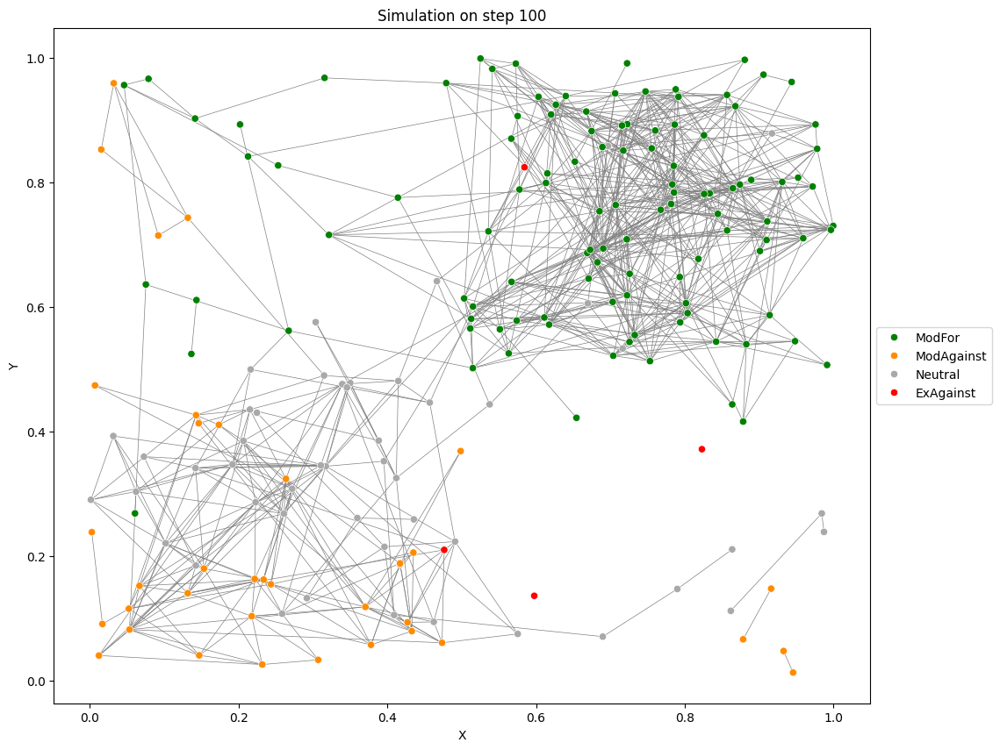

In [61]:
s.plot_network(100)

Chart:

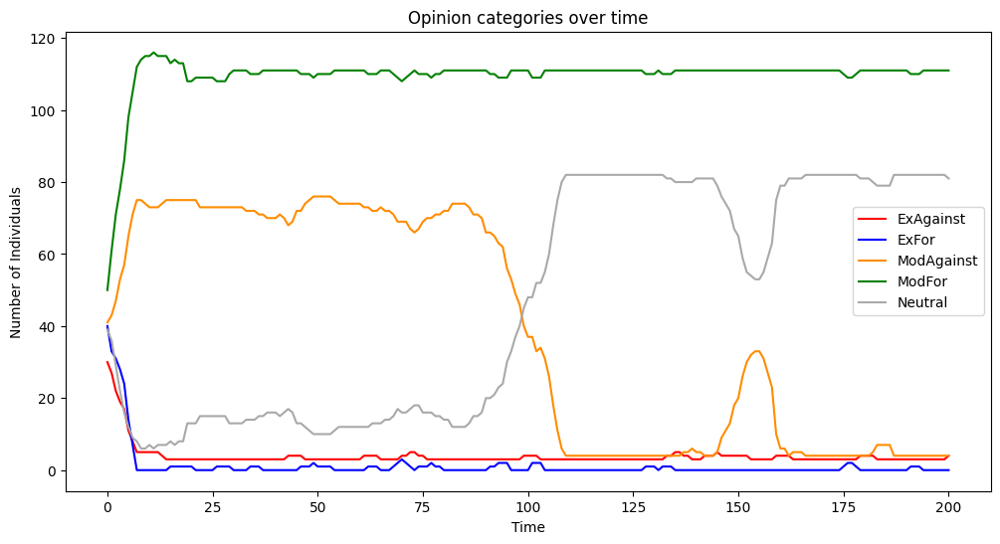

In [62]:
s.chart()
plt.show()

Friendship Chart:

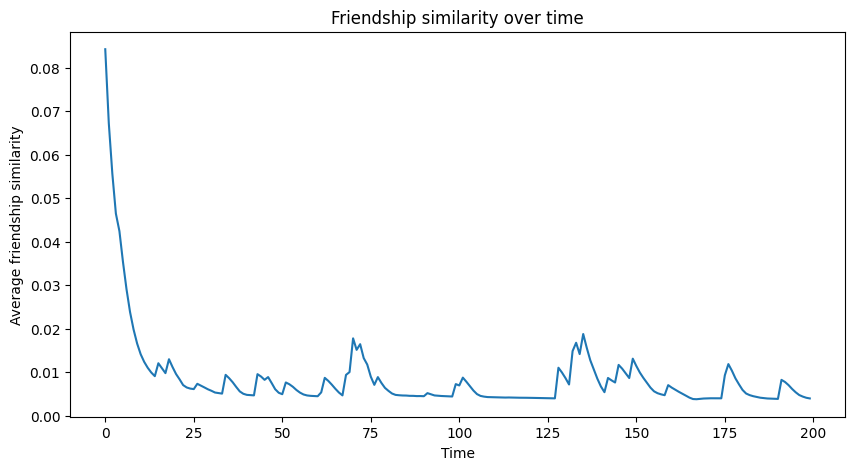

In [63]:
s.friendship_similarity_chart()

Ensemble Statistics (N = 50 replications):

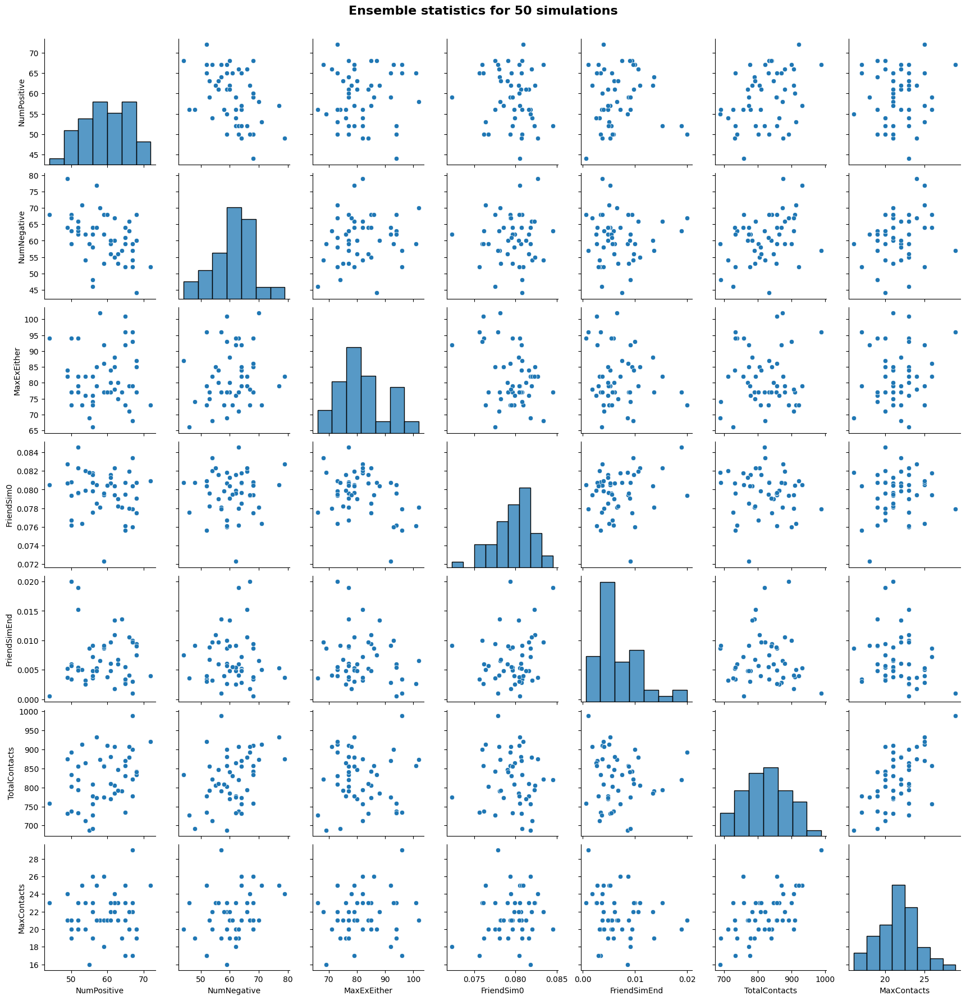

In [64]:
Simulation.ensemble_statistics(50, settings)

Demonstrating the effect of the different agent types:

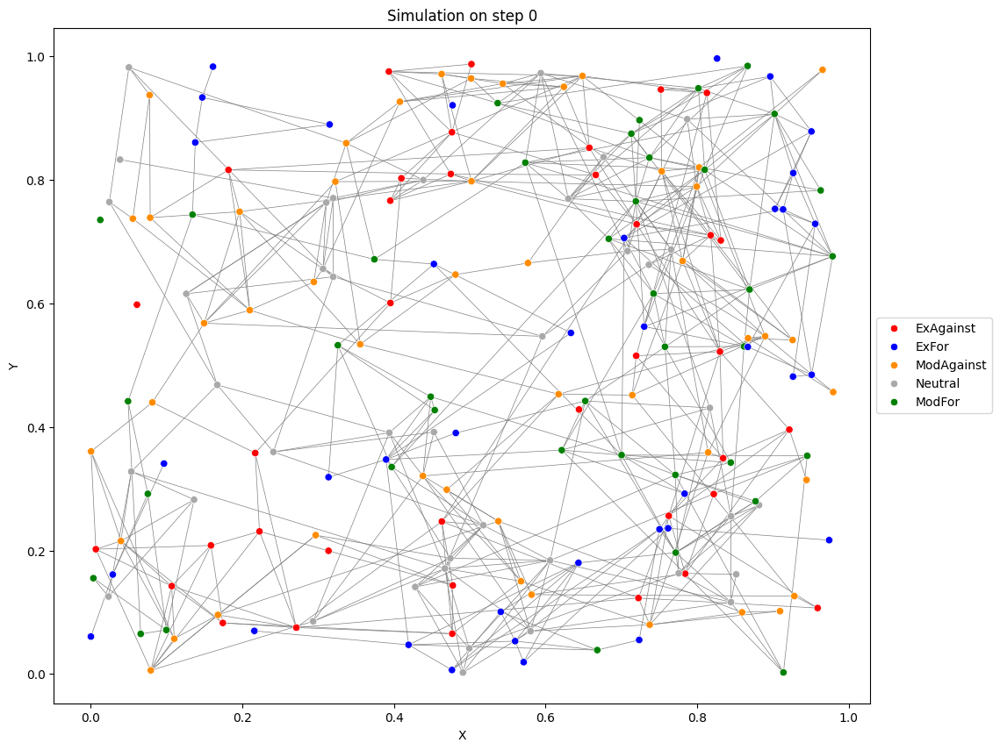

In [65]:
settings = Settings(duration=200, alpha_pos = 0.0, alpha_neg = 0.0)
s = Simulation(settings)
s.run()
s.plot_network(0)

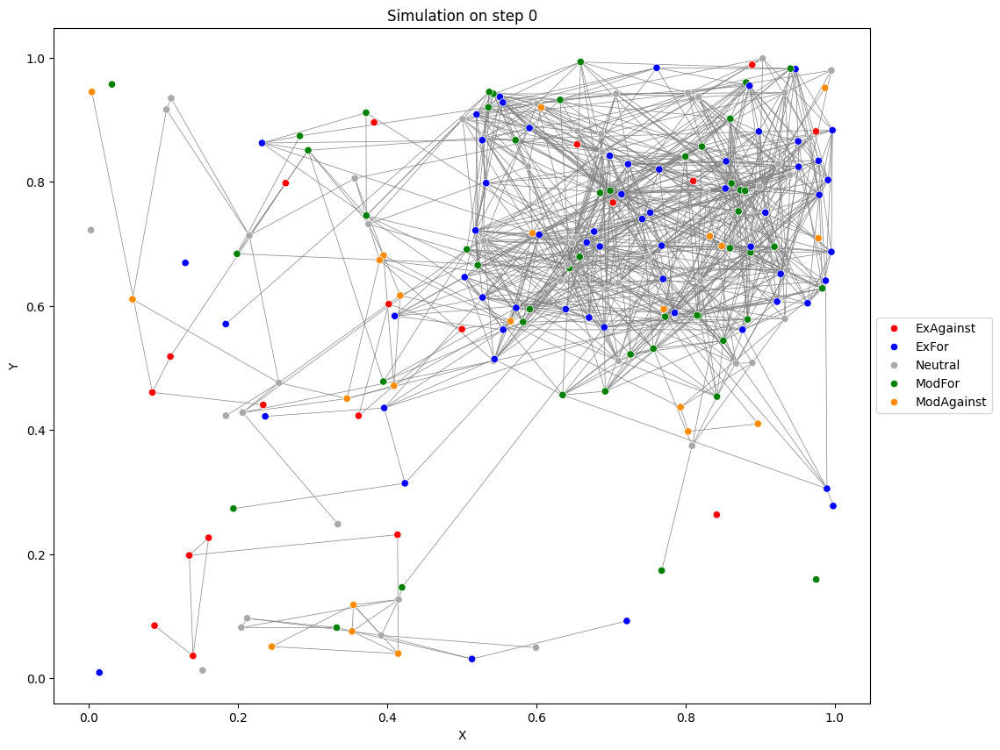

In [66]:
settings = Settings(duration=200, alpha_pos = 0.5, alpha_neg = 0.0)
s = Simulation(settings)
s.run()
s.plot_network(0)

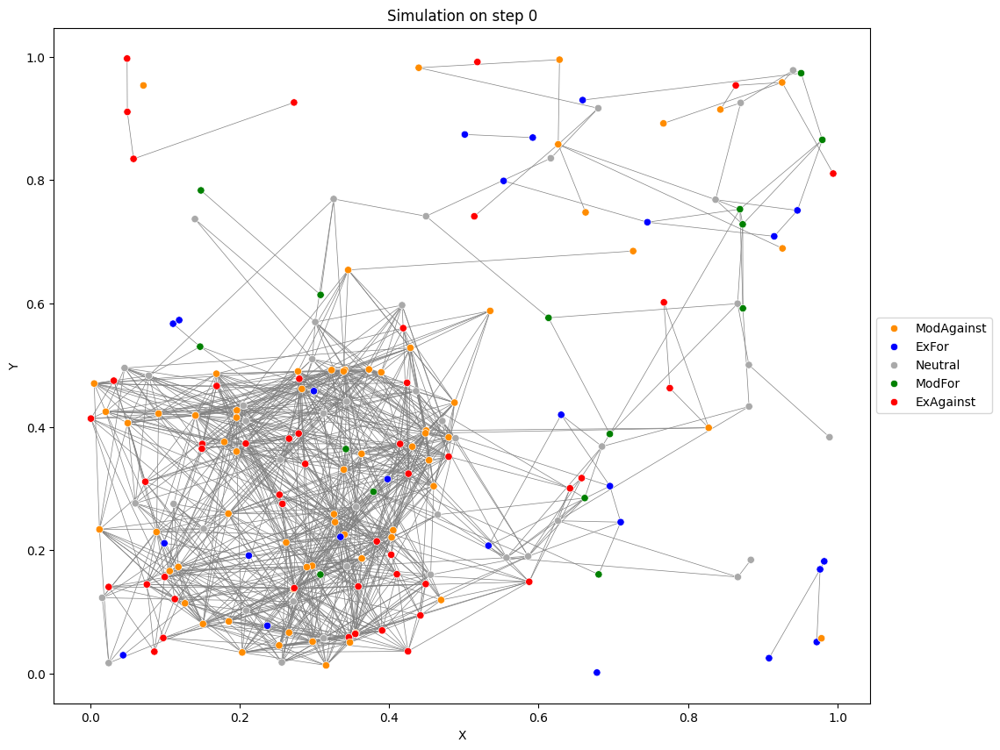

In [67]:
settings = Settings(duration=200, alpha_pos = 0.0, alpha_neg = 0.5)
s = Simulation(settings)
s.run()
s.plot_network(0)

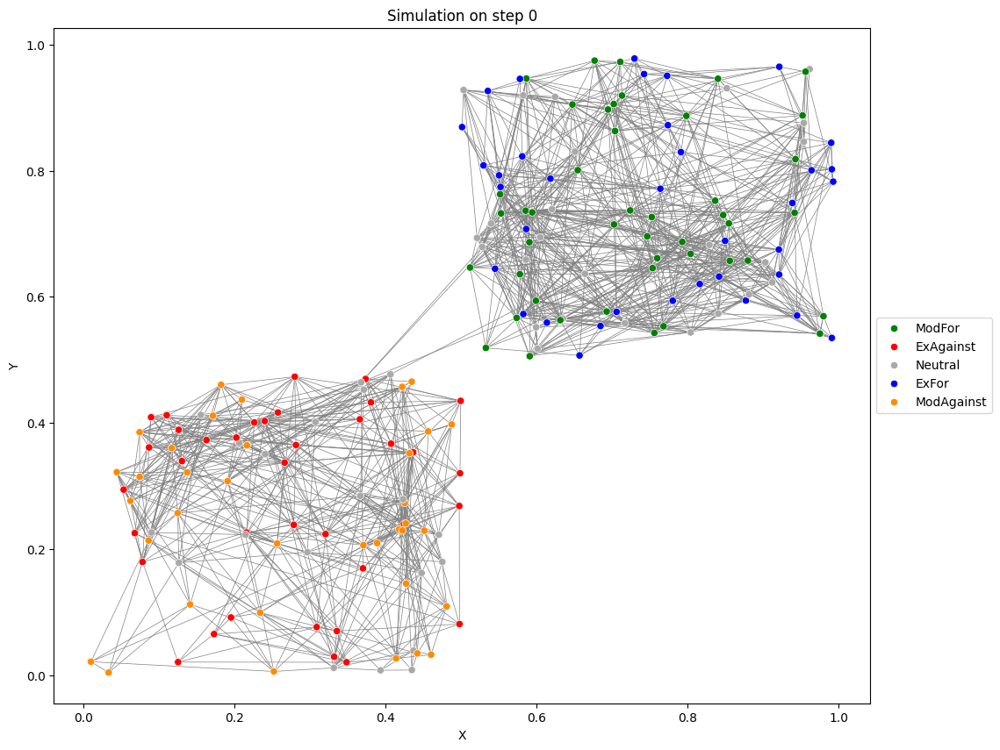

In [68]:
settings = Settings(duration=200, alpha_pos = 0.5, alpha_neg = 0.5)
s = Simulation(settings)
s.run()
s.plot_network(0)

Demonstrating the effect of the extreme probability:

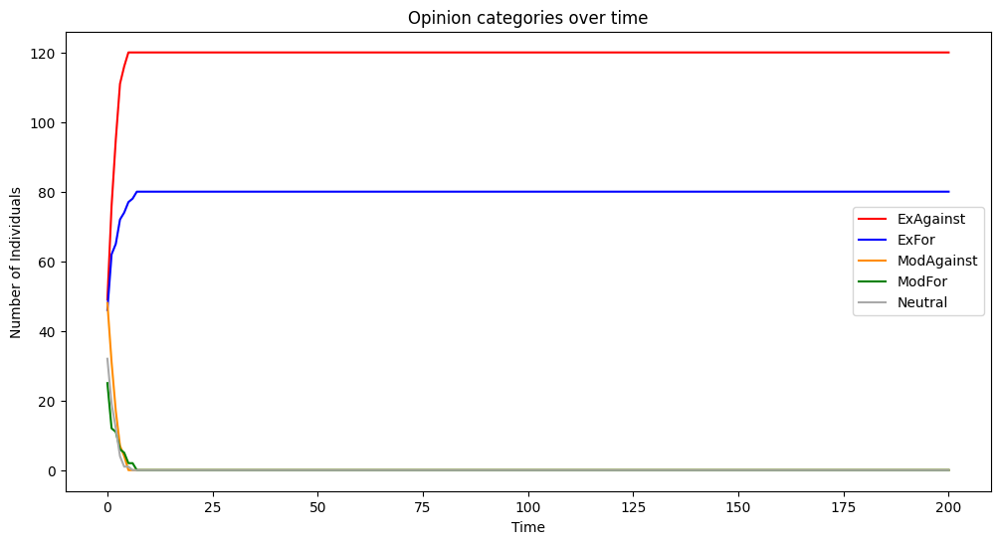

In [69]:
settings = Settings(duration=200, gamma_extr=0.4)
s = Simulation(settings)
s.run()
s.chart()

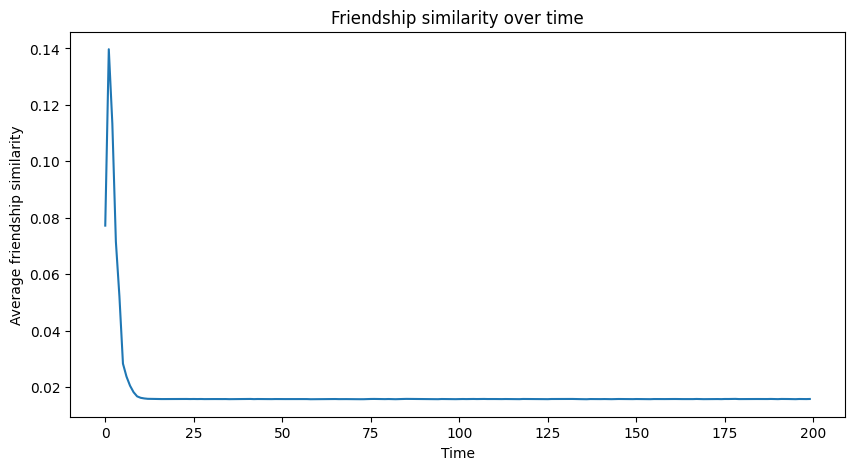

In [70]:
s.friendship_similarity_chart()

Demonstrating the Individual Summary:

In [71]:
settings = Settings(duration=200)
s = Simulation(settings)
s.run()
df = s.individual_summary()
df.head()

,indivNum,X,Y,ExAgainst,ModAgainst,Neutral,ModFor,ExFor
0,180,0.503436,0.859308,0.0,0.000000,0.089552,0.890547,0.0199
1,185,0.352953,0.227607,0.0,0.000000,0.985075,0.014925,0.0000
2,78,0.680302,0.756259,0.0,0.000000,0.094527,0.905473,0.0000
3,152,0.551235,0.591573,0.0,0.000000,0.104478,0.895522,0.0000
4,58,0.578510,0.331529,0.0,0.253731,0.746269,0.000000,0.0000


#### Assessment

##### 1. Start a simulation with the default parameters and plot the chart and the network at time 0, time 5 and time 10.

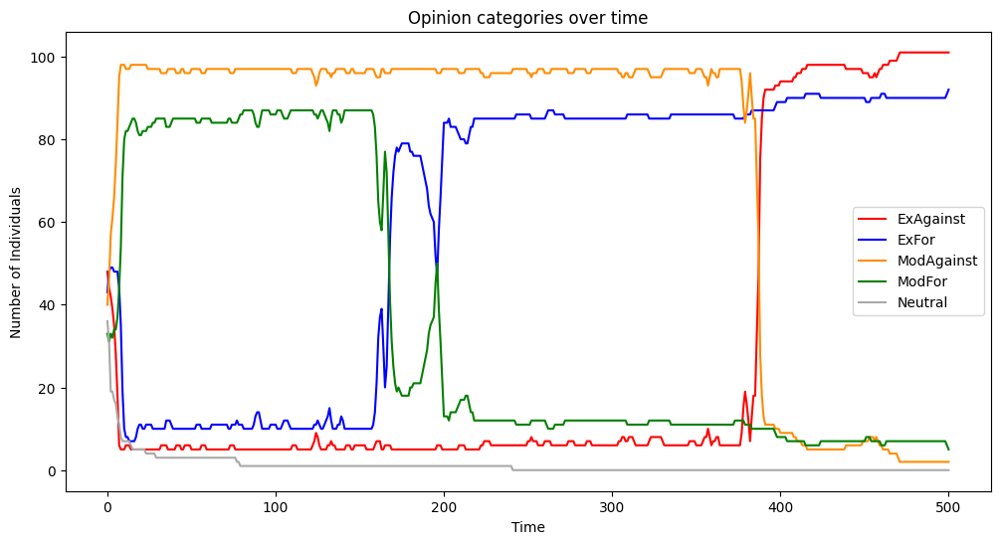

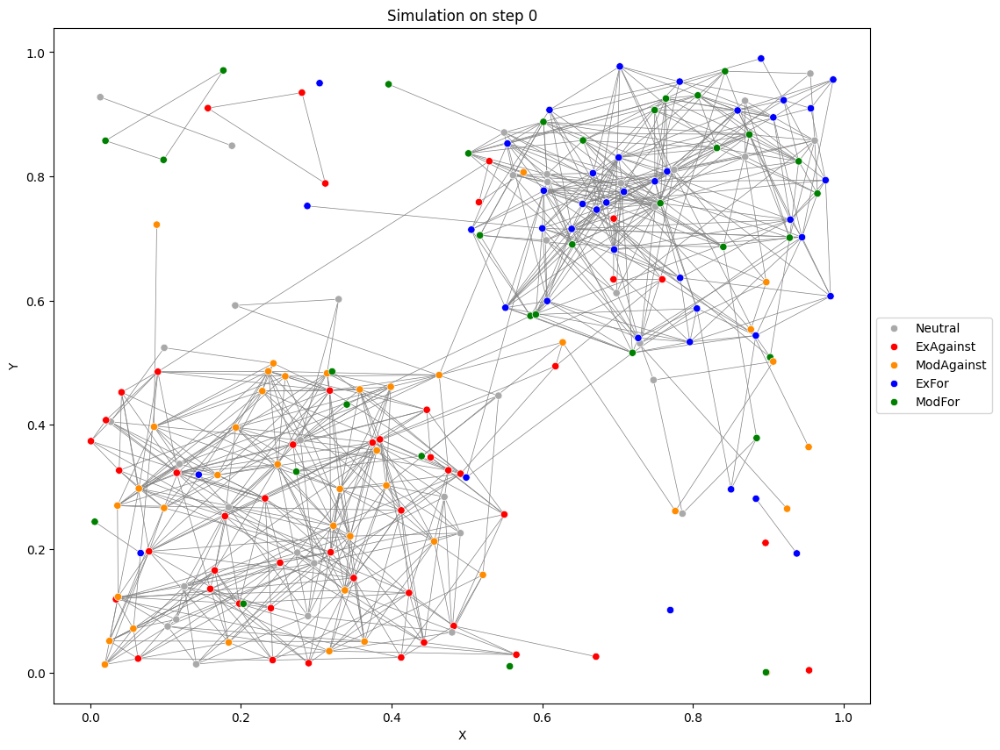

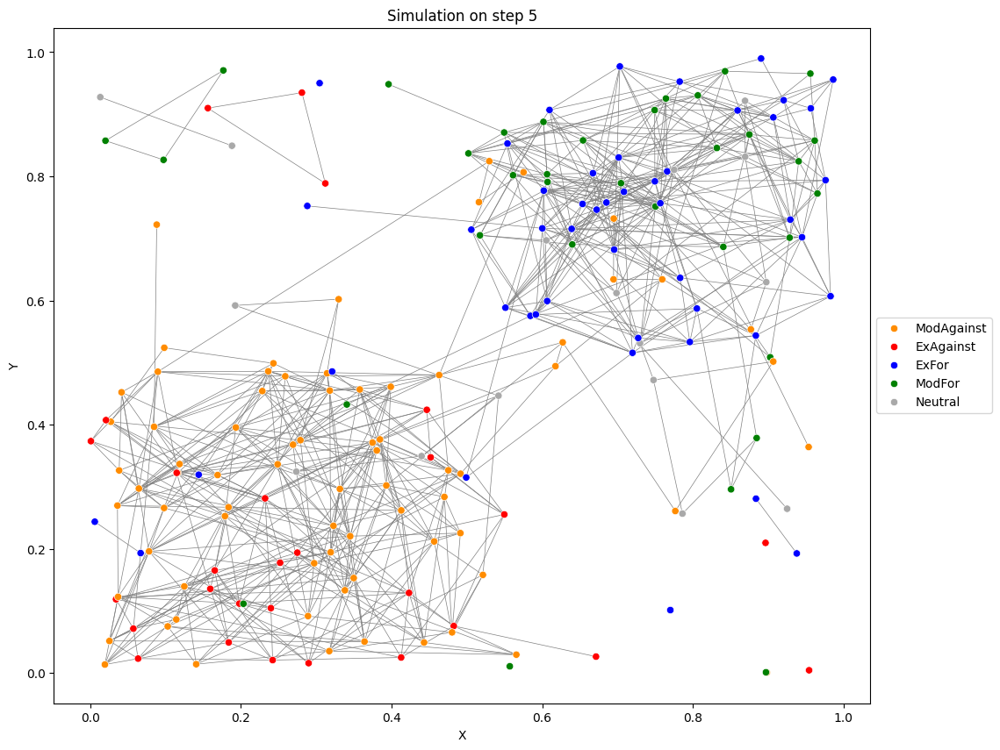

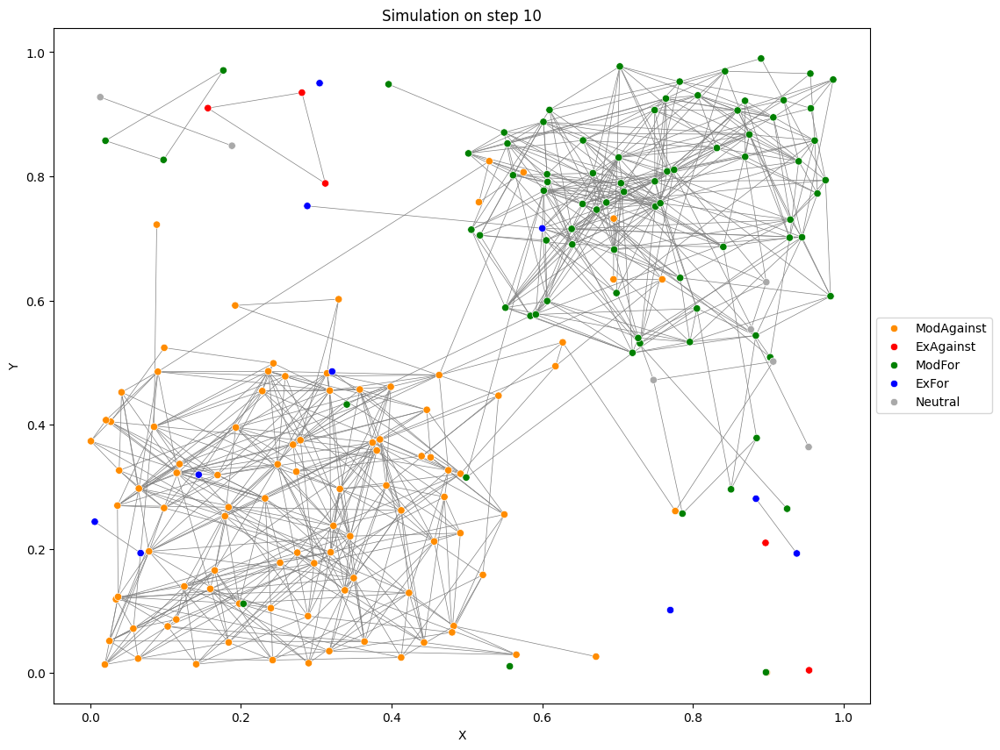

In [72]:
settings = Settings()
s = Simulation(settings)
s.run()
s.chart()
s.plot_network(0)
s.plot_network(5)
s.plot_network(10)

##### 2. Set 'beta_update' to 0 (and use defaults for the remaining parameters). Run a simulation with these parameters and plot the friendship similarity chart. Do the same but with the default value of 'beta_update'. Finally, do the same with all default values but set 'alpha_pos = 0', 'alpha_neg = 0', and 'alpha_stub = 1'. Comment on and compare the results from these simulations.

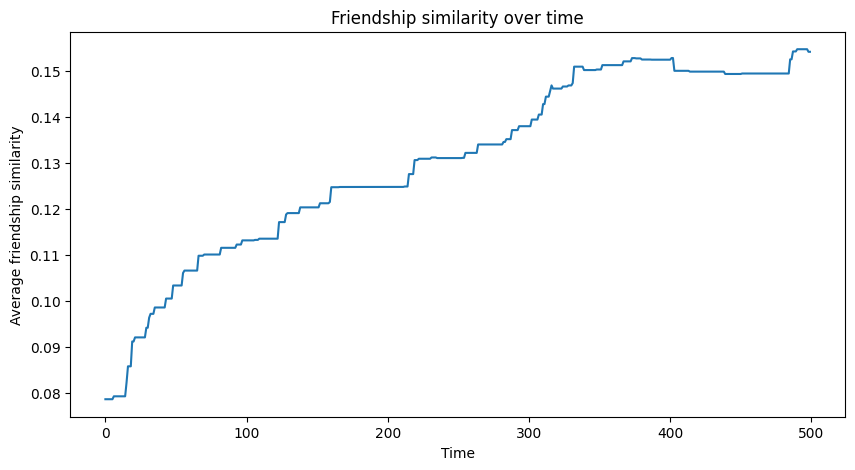

In [73]:
settings = Settings(beta_update=0)
s = Simulation(settings)
s.run()
s.friendship_similarity_chart()

- By default, at each time step an individual's opinion changes according to one of two mechanisms: they either get convinced their opinion is correct, or they get affected by their neighbours. However, when beta_update is 0, only the first mechanism will be in action. This means that at each step some individuals get completely convinced they are right and the opinion of the rest remains unchanged.
- When the simulation starts, individuals in contact are most likely similarly opinionated (since most individuals in the upper right quartile are moderately positive and most in the lower left are moderately negative). This means that, in the upper right quartile, when individuals start to get randomly convinced they are correct, some neutral or moderately positive individuals will become extremely positive, and some neutral or moderately negative individuals will become extremely negative. The opinion difference of extremely positive individuals from moderately positive individuals is greater than the difference between moderately positive individuals, and the opinion difference of extremely negative individuals from moderately positive individuals is greater than the difference of neutral or moderately negative individuals from moderately positive individuals. Changes in the lower left quartile also lead to such an increase of opinion differences, but towards the negative extreme instead. All in all, the difference of opinions between neighbouring individuals (and of individuals in contact) increases. 
- The plot confirms the above, as it shows that the 'friendship_similarity' curve increases ('friendship_similarity' in the code is actually measuring "dis-similarity", averaging the absolute opinion differences between contacts).

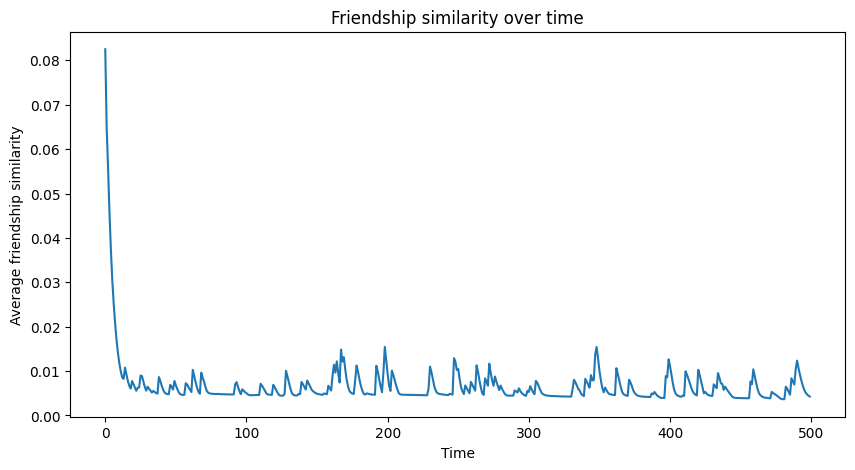

In [74]:
settings = Settings()
s = Simulation(settings)
s.run()
s.friendship_similarity_chart()

- Given the default parameters ('alpha_pos = alpha_neg = 0.3'), moderately positive individuals are ~twice as likely to be generated in the upper right quartile than unbiased individuals (who can have any random opinion). Essentially, this means that there are some (few) differently opinionated individuals generated among the many moderately positive individuals (same is true for moderately negative  individuals in the lower left quartile). The opinion of the "outstanding" individuals will most likely get affected by that of their contacts (since 'gamma_extr' is only 0.1 by default). So, at the first steps of the simulation all the randomly opinionated individuals will start moving towards a moderate opinion (same as that of their contacts), and thus the measured 'friendship_similarity' will drastically decrease. After this abrupt change, most befriended individuals have become similarly opinionated, and changes become much less drastic. The 'friendship_similarity' flunctuates up and down in a small range; some times it increases due to individuals getting randomly convinced (which can lead them away from their contacts' opinions), but soon it drops down again due to the dominating contact effect.
- This expected behavior is apparent in the plot, where we see the 'friendship_similarity' line dropping fast during the first ~12 steps, and then tightly flunctuating above 0 (absolute opinion difference is measured, so 'friendship_similarity' has to be greater than 0).

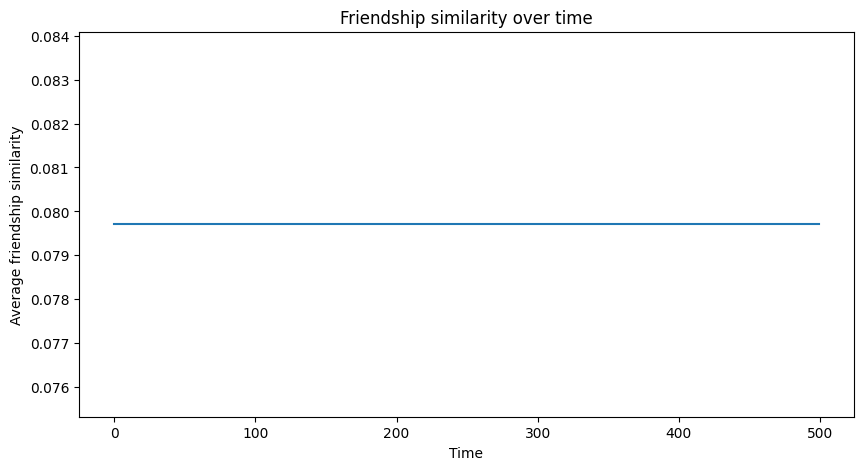

In [75]:
settings = Settings(alpha_pos=0, alpha_neg=0, alpha_stub=1)
s = Simulation(settings)
s.run()
s.friendship_similarity_chart()

- When 'alpha_pos=0', 'alpha_neg=0', and 'alpha_stub=1', all individuals are stubborn, which means their opinion never changes.
- Thus, the similarity between all individuals in contact (all individuals in general actually) will remain constant over time.
- As expected, the 'friendship_similarity' line in the plot is flat.

The three plots represent three distinct simulation cases. In the first, the 'friendship_similarity' is in an upwards trend, in the second, 'friendship_similarity' drops abruptly and then starts flunctuating, and in the third one, 'friendship_similarity' remains constant. Diffferent mechanisms drive each of these behaviours. The first case is driven by individuals getting completely convinced their opinion is correct. The second case is driven both by the random convincing of individuals and by the contacts effect. In the third case, none of the two mechanisms is in action, and the simulation stays still.

##### 3. With the default parameters and varying 'gamma_dist' from 10 to 20 in increments of 1.0, plot the network at the end of the simulation and the chart, and comment on the results.

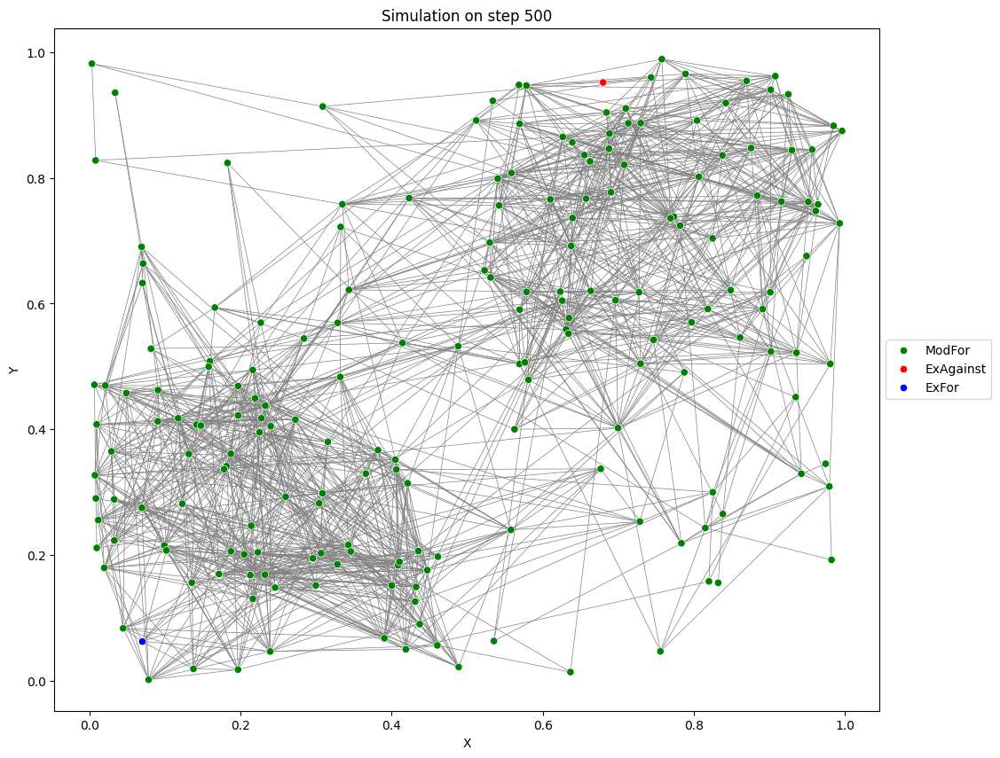

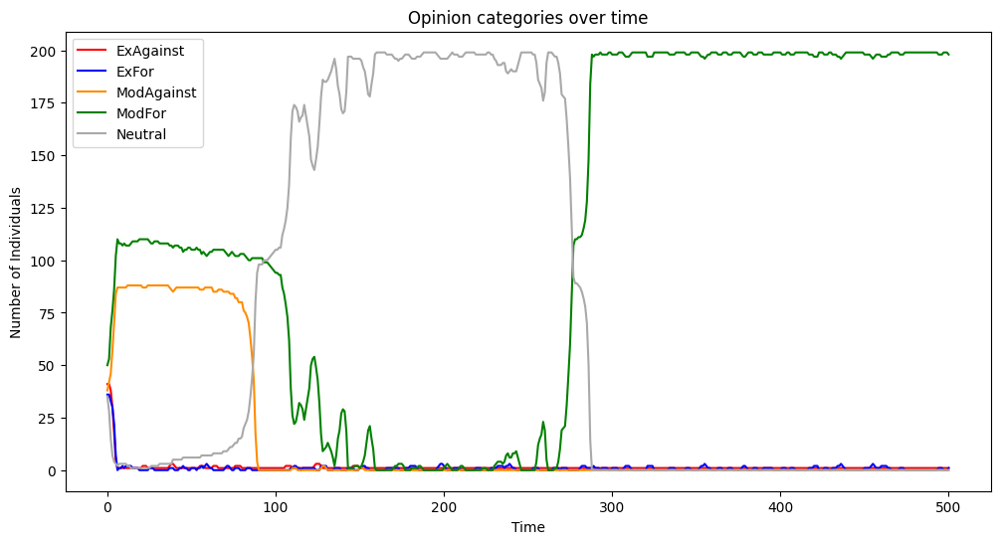

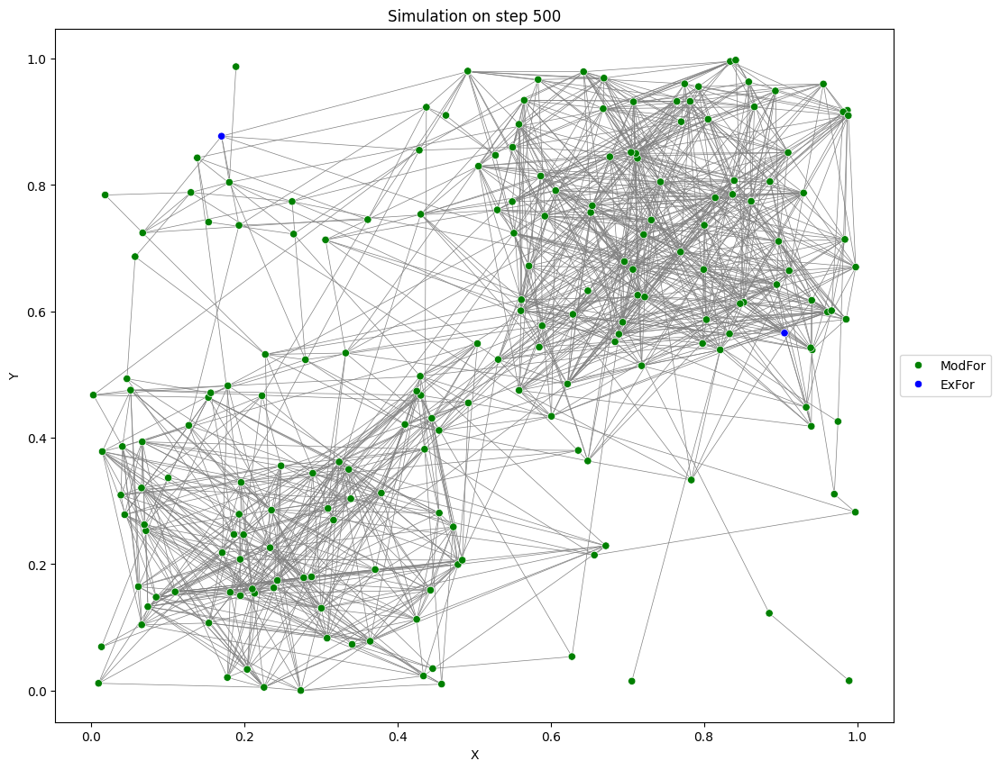

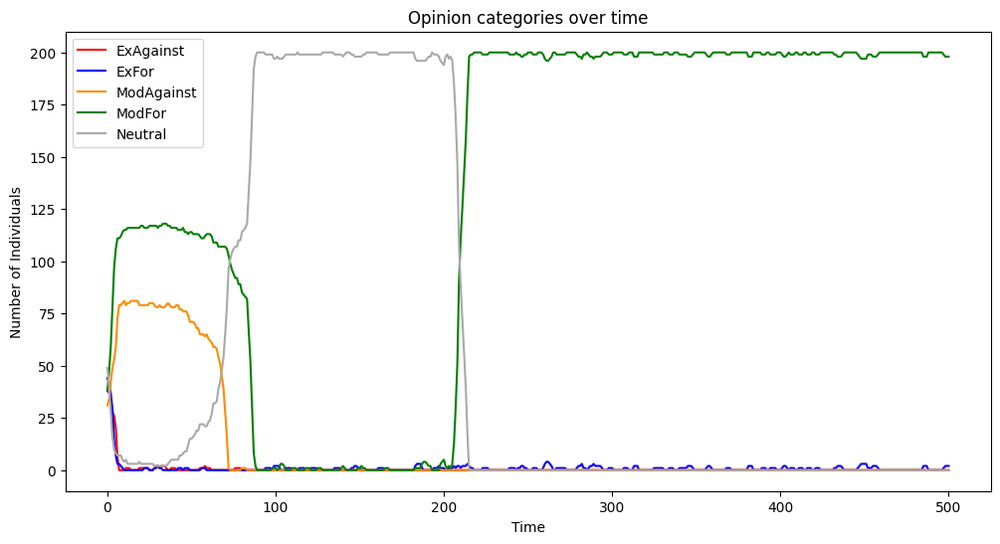

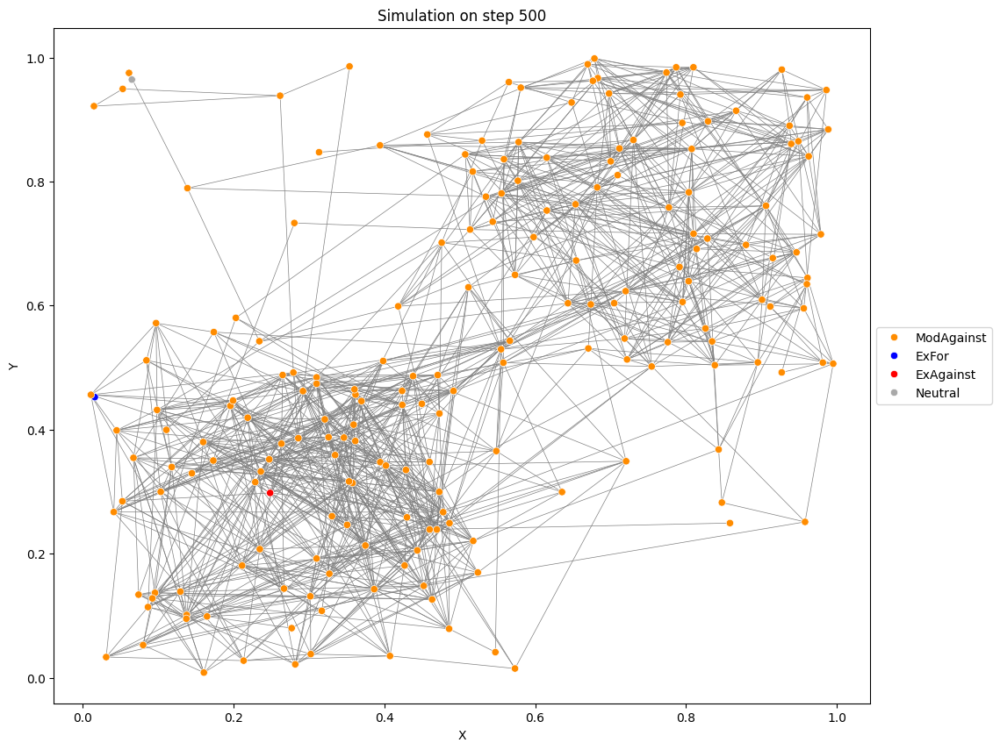

...

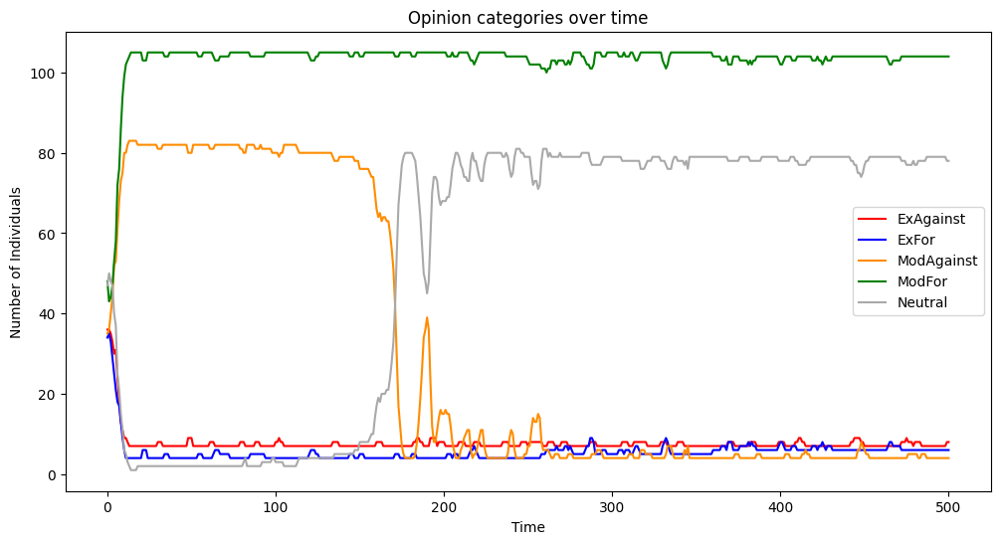

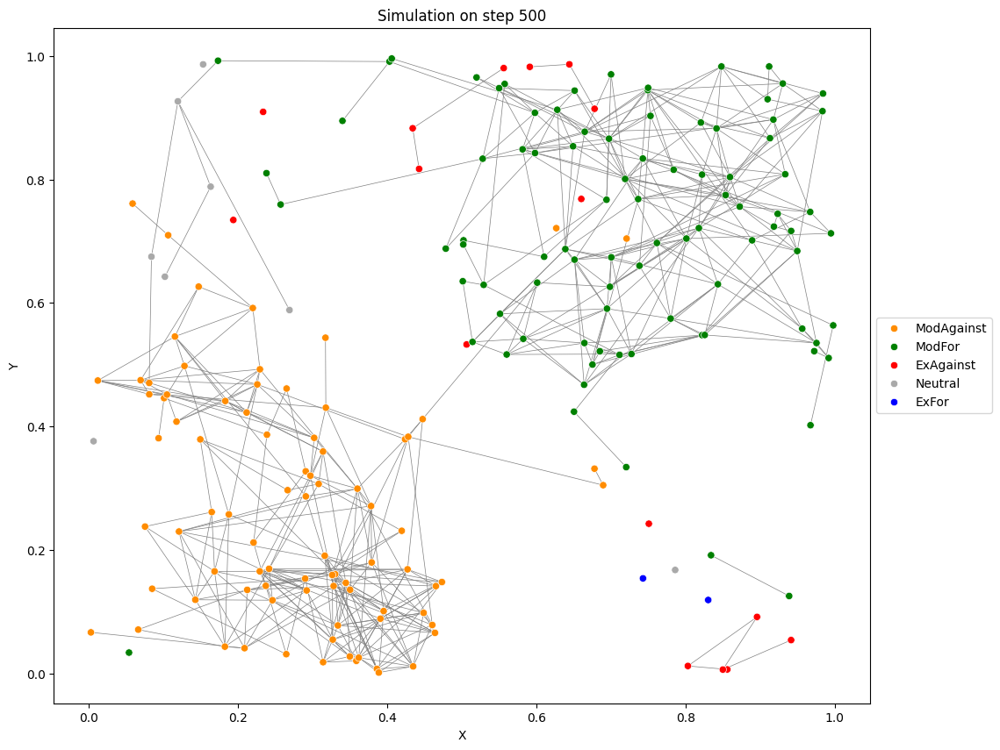

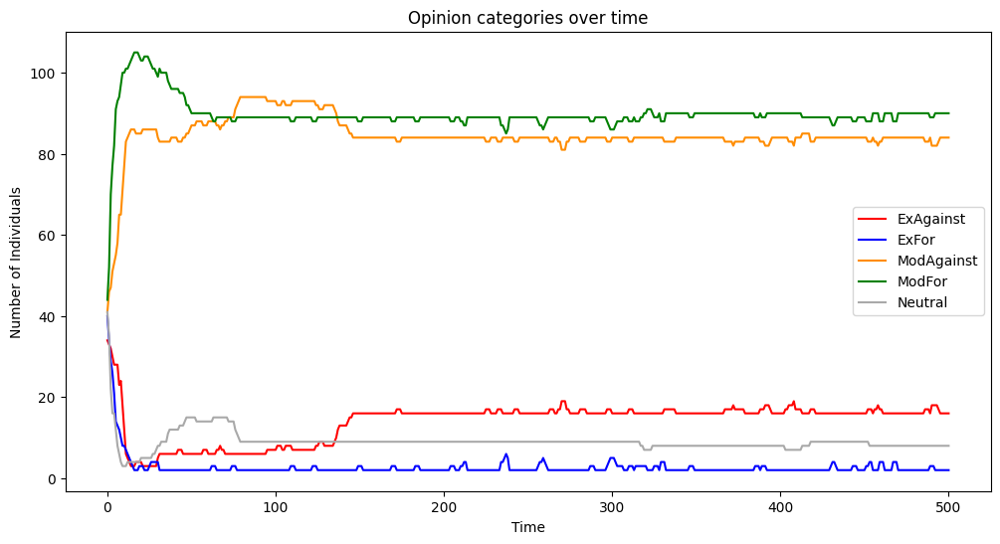

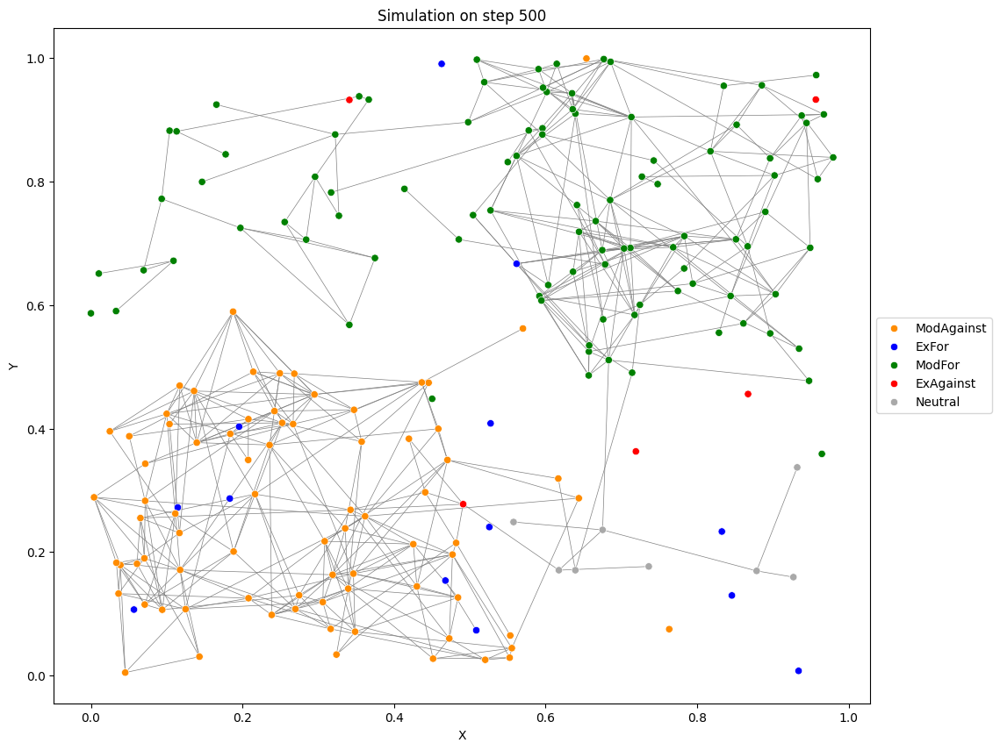

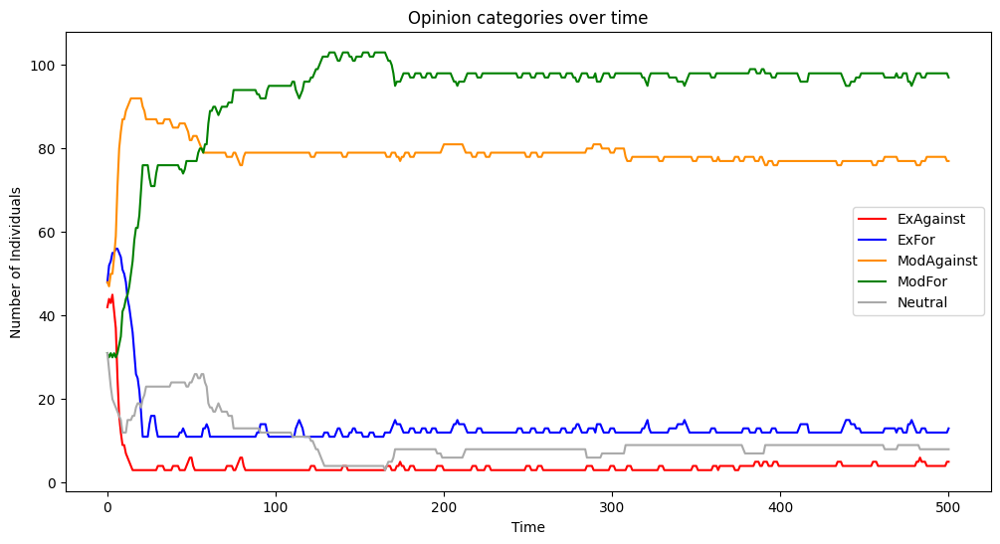

In [76]:
for gamma_dist in range(10, 21):
    settings = Settings(gamma_dist=gamma_dist)
    s = Simulation(settings)
    s.run()
    s.plot_network(settings.duration)
    s.chart()

- The probability that two individuals are in contact gets more negatively affected by their distance, the higher the value of 'gamma_dist' gets.
- This effect becomes apparent in the 'network' charts, where the number of contacts that each individual has (i.e. the number of edges that start from each node) decreases as 'gamma_dist' increases.
- There is no observable difference between the 'friendship_similarity' charts with respect to the changing 'gamma_dist', i.e. no pattern is observed in relation to 'gamma_dist''s increase. The number of contacts each individual has (which is what 'gamma_dist' affects) does not directly influence how oppinions change during the simulation. This is because the opinions of contacts get averaged before influencing each individual's opinion. However, it is also true that the more contacts an individual has, the less is the effect of each single contact to their average. This more indirect effect of 'gamma_dist' could potentially become observable if a wider range of 'gamma_dist' was investigated. 